In [1]:
!pip install -q kaggle

In [2]:
import tensorflow_hub as hub
import tensorflow as tf
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import random
import cv2
import numpy as np
from google.colab import files
import zipfile,os
from datetime import datetime
%load_ext tensorboard

%matplotlib inline
files.upload()

Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"fahrulfirmansyah","key":"e47cd1892243c657c9836e87bc366112"}'}

In [3]:
!mkdir ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

In [4]:
!kaggle datasets download -d sriramr/fruits-fresh-and-rotten-for-classification

100% 3.57G/3.58G [00:30<00:00, 171MB/s]
100% 3.58G/3.58G [00:30<00:00, 127MB/s]


In [5]:
local_zip = '/content/fruits-fresh-and-rotten-for-classification.zip'
zip_ref = zipfile.ZipFile(local_zip, 'r')
zip_ref.extractall('/content')
zip_ref.close()

In [6]:
base_dir = '/content/dataset'

In [7]:
test_dir = os.path.join(base_dir, 'test')
train_dir = os.path.join(base_dir, 'train')

In [10]:
from keras.preprocessing.image import ImageDataGenerator
import tensorflow as tf
train_datagen = ImageDataGenerator(
                    rescale=1./255,
                    horizontal_flip=True,
                   
                    )

validation_datagen = ImageDataGenerator(
                    rescale=1./255
                    )

In [11]:
train_generator = train_datagen.flow_from_directory(
        train_dir,
        shuffle=True,
        target_size=(224, 224),
        class_mode='categorical')

validation_generator = validation_datagen.flow_from_directory(
        test_dir,
        target_size=(224, 224),
        class_mode='categorical')


Found 10901 images belonging to 6 classes.
Found 2698 images belonging to 6 classes.


In [12]:

!rm -rf logs

training_image = []
training_label = []
for i in range(30):
  batch = train_generator.next()
  training_image.append(batch[0])
  training_label.append(batch[1])

logdir = "logs/train_data/" + datetime.now().strftime("%Y%m%d-%H%M%S")
file_writer = tf.summary.create_file_writer(logdir)

with file_writer.as_default():
  images = np.reshape(training_image, (-1,224,224,3))
  tf.summary.image('Train Data', images, max_outputs=30, step=0)
%tensorboard --logdir logs/train_data

<IPython.core.display.Javascript object>

In [13]:
!lsof -i:6006

COMMAND    PID USER   FD   TYPE DEVICE SIZE/OFF NODE NAME
tensorboa 2314 root   10u  IPv4  67027      0t0  TCP localhost:6006 (LISTEN)


In [14]:
!kill 2314     

In [15]:
!rm -rf logs

logdir = "logs/test_data/" + datetime.now().strftime("%Y%m%d-%H%M%S")
# create file writer for the log directory
file_writer = tf.summary.create_file_writer(logdir)

test_image = []
test_label = []
# image_tensor = tf.convert_to_tensor(images)
for i in range(30):
  batch = validation_generator.next()
  test_image.append(batch[0])
  test_label.append(batch[1])
  

with file_writer.as_default():
  images = np.reshape(test_image, (-1, 224,224,3))
  tf.summary.image("Test Data", images, max_outputs=30, step=0)

%tensorboard --logdir logs/test_data

<IPython.core.display.Javascript object>

In [16]:
!lsof -i:6006

COMMAND    PID USER   FD   TYPE DEVICE SIZE/OFF NODE NAME
tensorboa 2568 root   11u  IPv4  72365      0t0  TCP localhost:6006 (LISTEN)


In [18]:
!kill 2568   

Total Data in freshbanana : 1581
Total Data in rottenbanana : 2224
Total Data in freshapples : 1693
Total Data in freshoranges : 1466
Total Data in rottenoranges : 1595
Total Data in rottenapples : 2342
Total Data : 10901


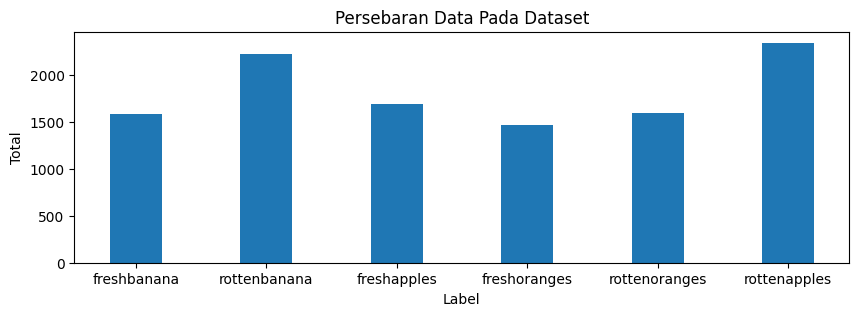

In [20]:
def check_data(path):
  labels = os.listdir(path)
  total_data = 0
  count = []
  for label in labels:
    label_path = os.path.join(path, label)
    label_data = os.listdir(label_path)
    count.append(len(label_data))
    total_data += len(label_data)
    print('Total Data in {path} : {sum}'.format(path = label, sum = len(label_data)))
    
  print('Total Data : {}'.format(total_data))
  plt.figure(figsize=(10, 3))
  plt.bar(labels, count, align='center', width=0.4)
  plt.title('Persebaran Data Pada Dataset')
  plt.xlabel('Label')
  plt.ylabel('Total')
  plt.show()
  return total_data
train_data_total = check_data(train_dir)

/content/dataset/train/freshbanana/saltandpepper_Screen Shot 2018-06-12 at 9.52.37 PM.png
/content/dataset/train/rottenbanana/saltandpepper_Screen Shot 2018-06-12 at 8.59.02 PM.png
/content/dataset/train/freshapples/Screen Shot 2018-06-08 at 5.28.15 PM.png
/content/dataset/train/freshoranges/vertical_flip_Screen Shot 2018-06-13 at 12.00.17 AM.png
/content/dataset/train/rottenoranges/rotated_by_15_Screen Shot 2018-06-12 at 11.32.50 PM.png
/content/dataset/train/rottenapples/rotated_by_30_Screen Shot 2018-06-08 at 2.51.09 PM.png


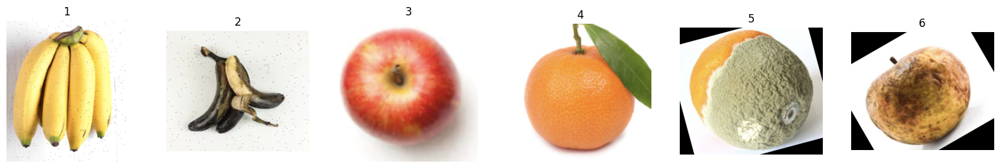

In [21]:
fig = plt.figure(figsize=(20, 20))

rows = 6
columns = 6

labels = os.listdir(train_dir)
for i in range(7):
  if i == 0:
    continue
  fig.add_subplot(rows, columns, i)
  image_path = os.path.join(train_dir, labels[i-1])
  random_image = random.sample(os.listdir(image_path), 1)
  image_path = os.path.join(image_path ,random_image[0])
  mg = mpimg.imread(image_path)
  print(image_path)
  plt.imshow(mg)
  plt.axis('off')
  plt.title(str(i))

In [22]:
def view_random_image(target_dir, target_class):
  target_folder = target_dir + target_class
  random_image = random.sample(os.listdir(target_folder), 1)

  img = mpimg.imread(target_folder + '/' + random_image[0])
  plt.imshow(img)
  plt.title(target_class)

  print(f"Ukuran Gambar :{img.shape}")


Ukuran Gambar :(290, 358, 3)


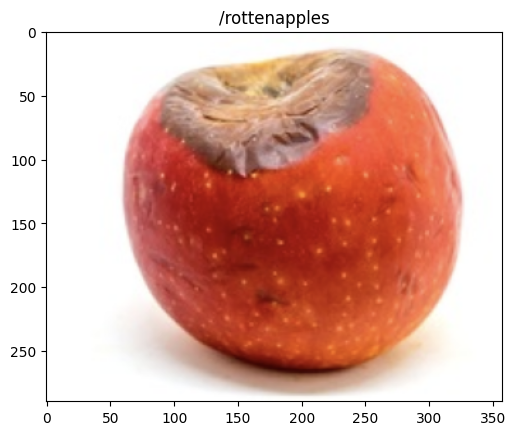

In [23]:
image = []
view_random_image(train_dir, '/rottenapples')
  

In [24]:
module_selection = ("mobilenet_v2", 224, 1280) #@param ["(\"mobilenet_v2\", 224, 1280)", "(\"inception_v3\", 299, 2048)"] {type:"raw", allow-input: true}
handle_base, pixels, FV_SIZE = module_selection
MODULE_HANDLE ="https://tfhub.dev/google/tf2-preview/{}/feature_vector/4".format(handle_base)
IMAGE_SIZE = (pixels, pixels)
print("Using {} with input size {} and output dimension {}".format(MODULE_HANDLE, IMAGE_SIZE, FV_SIZE))

Using https://tfhub.dev/google/tf2-preview/mobilenet_v2/feature_vector/4 with input size (224, 224) and output dimension 1280


In [25]:
feature_extractor = hub.KerasLayer(MODULE_HANDLE,
                                   input_shape=IMAGE_SIZE + (3,), 
                                   output_shape=[FV_SIZE],
                                   trainable=True)

In [28]:
print("Building model with", MODULE_HANDLE)

model = tf.keras.Sequential([
        feature_extractor,
        tf.keras.layers.Dense(6, activation='softmax')
])

model.summary()

Building model with https://tfhub.dev/google/tf2-preview/mobilenet_v2/feature_vector/4
Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1280)              2257984   
                                                                 
 dense_1 (Dense)             (None, 6)                 7686      
                                                                 
Total params: 2,265,670
Trainable params: 2,231,558
Non-trainable params: 34,112
_________________________________________________________________


In [29]:
model.compile(
    optimizer='adam',
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

EPOCHS = 50

hist = model.fit(
    train_generator,
    epochs=EPOCHS,
    validation_data=validation_generator,
)

Epoch 1/50
341/341 [==============================] - 111s 245ms/step - loss: 0.2033 - accuracy: 0.9691 - val_loss: 0.2864 - val_accuracy: 0.9548
Epoch 2/50
341/341 [==============================] - 72s 212ms/step - loss: 0.1519 - accuracy: 0.9844 - val_loss: 0.1455 - val_accuracy: 0.9867
Epoch 3/50
341/341 [==============================] - 73s 215ms/step - loss: 0.1675 - accuracy: 0.9786 - val_loss: 0.1310 - val_accuracy: 0.9893
Epoch 4/50
341/341 [==============================] - 72s 211ms/step - loss: 0.1334 - accuracy: 0.9889 - val_loss: 0.7062 - val_accuracy: 0.8547
Epoch 5/50
341/341 [==============================] - 76s 223ms/step - loss: 0.1380 - accuracy: 0.9878 - val_loss: 0.4159 - val_accuracy: 0.9199
Epoch 6/50
341/341 [==============================] - 74s 216ms/step - loss: 0.1249 - accuracy: 0.9908 - val_loss: 0.1243 - val_accuracy: 0.9900
Epoch 7/50
341/341 [==============================] - 72s 211ms/step - loss: 0.1479 - accuracy: 0.9842 - val_loss: 0.1264 - val_a

KeyboardInterrupt: ignored

In [34]:
model.save('model.h5')

# Download the saved model
files.download('model.h5')


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Saving banan1.jpg to banan1 (1).jpg
1/1 [==============================] - 0s 22ms/step
[[6.2449240e-06 1.6049975e-05 7.5794446e-01 2.4190992e-06 2.2644302e-09
  2.4203081e-01]]
banan1.jpg is a freshapples


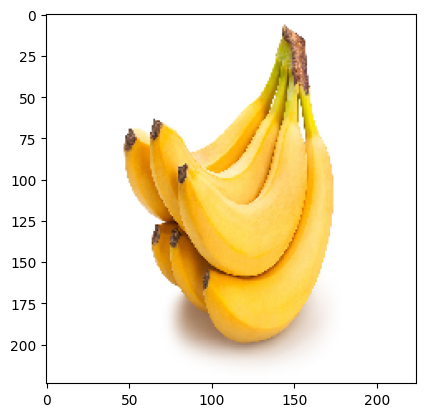

In [33]:
import numpy as np

# predict image
%matplotlib inline
uploaded = files.upload()
labels=''
for fn in uploaded.keys():
  path = fn
  img = tf.keras.utils.load_img(path, target_size=(224, 224))
  imgplot = plt.imshow(img)
  x = tf.keras.utils.img_to_array(img)
  x = np.expand_dims(x, axis=0)
  images = np.vstack([x])
  # print(images)
  arr = model.predict(images, batch_size=10)
  print(arr)
  predicted_class = np.argmax(arr, axis=1)[0]  
  if predicted_class == 0:
      labels = 'rottenoranges'
  elif predicted_class == 1:
      labels = 'rottenbanana'
  elif predicted_class == 2:
      labels = 'freshapples'
  elif predicted_class == 3:
      labels = 'freshoranges'
  elif predicted_class == 4:
      labels = 'freshbanana'
  elif predicted_class == 5:
      labels = 'rottenapples'
  print('{} is a {}'.format(fn, labels))


# Total Data in freshoranges : 1466
# Total Data in rottenbanana : 2224
# Total Data in freshbanana : 1581
# Total Data in freshapples : 1693
# Total Data in rottenapples : 2342
# Total Data in rottenoranges : 1595
